# Business Objective
An education company named X Education sells online courses to industry professionals. On any given day, many professionals who are interested in the courses land on their website and browse for courses.

X Education has appointed you to help them select the most promising leads, i.e. the leads that are most likely to convert into paying customers. The company requires you to build a model wherein you need to assign a lead score to each of the leads such that the customers with higher lead score have a higher conversion chance and the customers with lower lead score have a lower conversion chance. The CEO, in particular, has given a ballpark of the target lead conversion rate to be around 80%.

# Importing Libraries and warnings

In [1]:
#import the warnings.
import warnings 
warnings.filterwarnings('ignore')

In [2]:
#Import the required Libraries.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


from sklearn.model_selection import train_test_split

from sklearn.preprocessing import StandardScaler

from sklearn.feature_selection import RFE
# Import 'LogisticRegression'
from sklearn.linear_model import LogisticRegression

import statsmodels.api as sm

from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import r2_score
from sklearn import metrics

# Changing the number of rows to be displayed using display.max_rows.

In [3]:
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)

# Data Reading & Data Types of Leads csv

In [4]:
#Read the data set of "Leads csv" in inpDay.
lead_Score=pd.read_csv("Leads.csv") 
lead_Score.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,Page Visited on Website,NaN,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Interested in other courses,Low in Relevance,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,Email Opened,India,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,NaN,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,Email Opened,India,Business Administration,Select,Student,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,Unreachable,India,Media and Advertising,Word Of Mouth,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,Not Sure,No,No,Select,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,Converted to Lead,India,Select,Other,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Select,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


In [5]:
#checking shapes of dataframe(rows and column) of Leads.csv.
lead_Score.shape

(9240, 37)

In [6]:
lead_Score.describe()

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score
count,9240.000000,9240.000000,9103.000000,9240.000000,9103.000000,5022.000000,5022.000000
mean,617188.435606,0.385390,3.445238,487.698268,2.362820,14.306252,16.344883
std,23405.995698,0.486714,4.854853,548.021466,2.161418,1.386694,1.811395
min,579533.000000,0.000000,0.000000,0.000000,0.000000,7.000000,11.000000
25%,596484.500000,0.000000,1.000000,12.000000,1.000000,14.000000,15.000000
50%,615479.000000,0.000000,3.000000,248.000000,2.000000,14.000000,16.000000
75%,637387.250000,1.000000,5.000000,936.000000,3.000000,15.000000,18.000000
max,660737.000000,1.000000,251.000000,2272.000000,55.000000,18.000000,20.000000


In [7]:
# Check the column-wise info of the dataframe leads.csv.
lead_Score.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 37 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9204 non-null   object 
 4   Do Not Email                                   9240 non-null   object 
 5   Do Not Call                                    9240 non-null   object 
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9103 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9103 

In [8]:
#calculate missing percentage in leads
100*lead_Score.isnull().mean()

Prospect ID                                       0.000000
Lead Number                                       0.000000
Lead Origin                                       0.000000
Lead Source                                       0.389610
Do Not Email                                      0.000000
Do Not Call                                       0.000000
Converted                                         0.000000
TotalVisits                                       1.482684
Total Time Spent on Website                       0.000000
Page Views Per Visit                              1.482684
Last Activity                                     1.114719
Country                                          26.634199
Specialization                                   15.562771
How did you hear about X Education               23.885281
What is your current occupation                  29.112554
What matters most to you in choosing a course    29.318182
Search                                            0.0000

# Understanding the Data Dictionary and parts of Data Preparation
The data dictionary contains the meaning of various attributes; some of which are explored and manipulated here:

In [9]:
# Converting 'Select' values to NaN.
lead_Score = lead_Score.replace('Select', np.nan)
#leads = leads.copy()

In [10]:
#calculate missing percentage in leads
100*lead_Score.isnull().mean()

Prospect ID                                       0.000000
Lead Number                                       0.000000
Lead Origin                                       0.000000
Lead Source                                       0.389610
Do Not Email                                      0.000000
Do Not Call                                       0.000000
Converted                                         0.000000
TotalVisits                                       1.482684
Total Time Spent on Website                       0.000000
Page Views Per Visit                              1.482684
Last Activity                                     1.114719
Country                                          26.634199
Specialization                                   36.580087
How did you hear about X Education               78.463203
What is your current occupation                  29.112554
What matters most to you in choosing a course    29.318182
Search                                            0.0000

In [11]:
# Dropping the column which is not required
columns_to_drop=['Prospect ID','Lead Number'] 
lead_Score=lead_Score.drop(columns=columns_to_drop, axis =1)

In [12]:
# Checking dataFrame with unique value
lead_Score.nunique()

Lead Origin                                         5
Lead Source                                        21
Do Not Email                                        2
Do Not Call                                         2
Converted                                           2
TotalVisits                                        41
Total Time Spent on Website                      1731
Page Views Per Visit                              114
Last Activity                                      17
Country                                            38
Specialization                                     18
How did you hear about X Education                  9
What is your current occupation                     6
What matters most to you in choosing a course       3
Search                                              2
Magazine                                            1
Newspaper Article                                   2
X Education Forums                                  2
Newspaper                   

In [13]:
lead_Score['How did you hear about X Education'].value_counts()

How did you hear about X Education
Online Search            808
Word Of Mouth            348
Student of SomeSchool    310
Other                    186
Multiple Sources         152
Advertisements            70
Social Media              67
Email                     26
SMS                       23
Name: count, dtype: int64

In [14]:
# Feature Magazine  have only one unique  value
lead_Score['Magazine'].value_counts()

Magazine
No    9240
Name: count, dtype: int64

In [15]:
# these column have only one unique  value. Hence deleteing these column as they will not contribute in further analysis . dropping 'How did you hear about X Education' as it has 78% null values Lead Quality 51% null Lead Profile 74%
columns_to_drop1=['Magazine','Receive More Updates About Our Courses','Update me on Supply Chain Content','Get updates on DM Content','I agree to pay the amount through cheque','How did you hear about X Education','Lead Quality','Lead Profile' ] 
lead_Score=lead_Score.drop(columns=columns_to_drop1, axis =1)


In [16]:
#calculate missing percentage in leads
100*lead_Score.isnull().mean()

Lead Origin                                       0.000000
Lead Source                                       0.389610
Do Not Email                                      0.000000
Do Not Call                                       0.000000
Converted                                         0.000000
TotalVisits                                       1.482684
Total Time Spent on Website                       0.000000
Page Views Per Visit                              1.482684
Last Activity                                     1.114719
Country                                          26.634199
Specialization                                   36.580087
What is your current occupation                  29.112554
What matters most to you in choosing a course    29.318182
Search                                            0.000000
Newspaper Article                                 0.000000
X Education Forums                                0.000000
Newspaper                                         0.0000

In [17]:
# Checking values Country Feature  and Imputing the missing values as India(mode)
lead_Score['Country'].replace(np.nan,'India',inplace=True)

In [18]:
# Checking values Country Feature
lead_Score['Country'].value_counts()

Country
India                   8953
United States             69
United Arab Emirates      53
Singapore                 24
Saudi Arabia              21
United Kingdom            15
Australia                 13
Qatar                     10
Hong Kong                  7
Bahrain                    7
Oman                       6
France                     6
unknown                    5
South Africa               4
Nigeria                    4
Germany                    4
Kuwait                     4
Canada                     4
Sweden                     3
China                      2
Asia/Pacific Region        2
Uganda                     2
Bangladesh                 2
Italy                      2
Belgium                    2
Netherlands                2
Ghana                      2
Philippines                2
Russia                     1
Switzerland                1
Vietnam                    1
Denmark                    1
Tanzania                   1
Liberia                    1
Malays

In [19]:
# Cheking City and imputing NAN with Mumbai
lead_Score['City'].replace(np.nan,'Mumbai',inplace=True)

In [20]:
lead_Score['What matters most to you in choosing a course'].value_counts()

What matters most to you in choosing a course
Better Career Prospects      6528
Flexibility & Convenience       2
Other                           1
Name: count, dtype: int64

In [21]:
# Imputing nan for following features with Missing. 
lead_Score['Specialization'] = lead_Score['Specialization'].fillna('Not Provided')
lead_Score['Tags'] = lead_Score['Tags'].fillna('Not Provided')
lead_Score['What matters most to you in choosing a course'] = lead_Score['What matters most to you in choosing a course'].fillna('Not Provided')
lead_Score['What is your current occupation'] = lead_Score['What is your current occupation'].fillna('Not Provided')

# Changing google to Google
lead_Score['Lead Source'] = lead_Score['Lead Source'].replace("google","Google")

lead_Score.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 27 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Lead Origin                                    9240 non-null   object 
 1   Lead Source                                    9204 non-null   object 
 2   Do Not Email                                   9240 non-null   object 
 3   Do Not Call                                    9240 non-null   object 
 4   Converted                                      9240 non-null   int64  
 5   TotalVisits                                    9103 non-null   float64
 6   Total Time Spent on Website                    9240 non-null   int64  
 7   Page Views Per Visit                           9103 non-null   float64
 8   Last Activity                                  9137 non-null   object 
 9   Country                                        9240 

In [22]:
#calculate missing percentage in application_data
100*lead_Score.isnull().mean()

Lead Origin                                       0.000000
Lead Source                                       0.389610
Do Not Email                                      0.000000
Do Not Call                                       0.000000
Converted                                         0.000000
TotalVisits                                       1.482684
Total Time Spent on Website                       0.000000
Page Views Per Visit                              1.482684
Last Activity                                     1.114719
Country                                           0.000000
Specialization                                    0.000000
What is your current occupation                   0.000000
What matters most to you in choosing a course     0.000000
Search                                            0.000000
Newspaper Article                                 0.000000
X Education Forums                                0.000000
Newspaper                                         0.0000

# Checking for imbalance in Converted

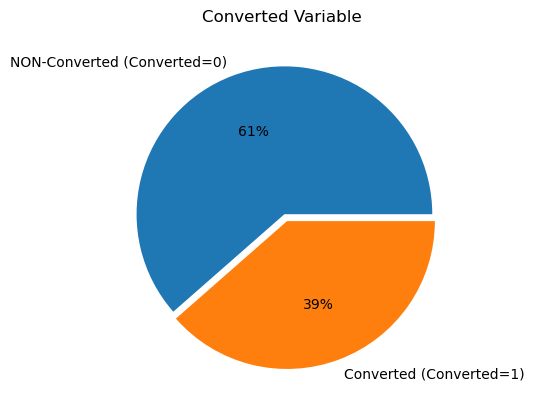

In [23]:
plt.pie(lead_Score['Converted'].value_counts(normalize=True)*100,labels=['NON-Converted (Converted=0)','Converted (Converted=1)'],explode=(0,0.05),autopct='%1.f%%')
plt.title('Converted Variable ')
plt.show()

# Key Insights

    1.Conversion rate is of 38.5%, meaning only 38.5% of the people have converted to leads.

    2. While 61.5% of the people did not convert to leads. 


# Univariant analysis.

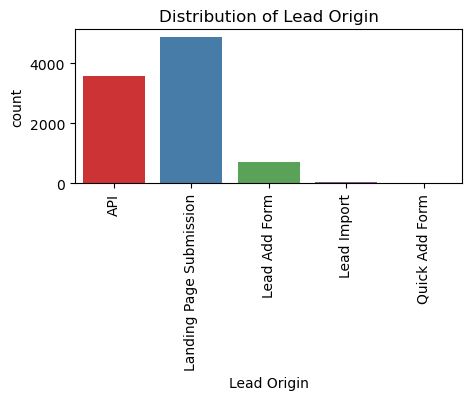

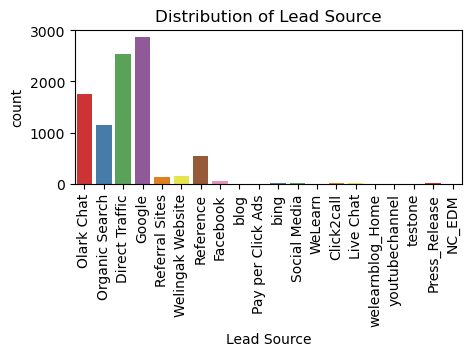

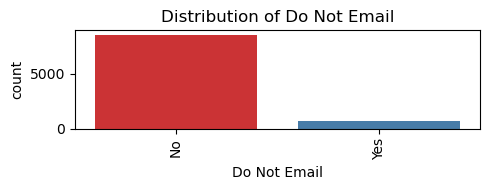

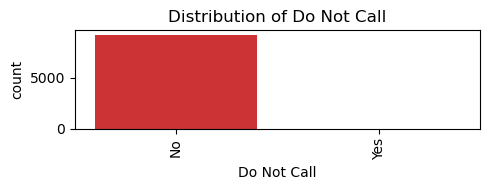

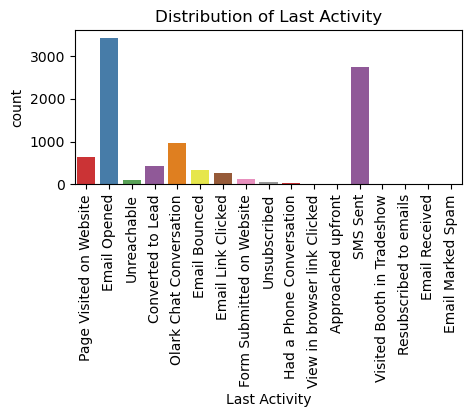

...

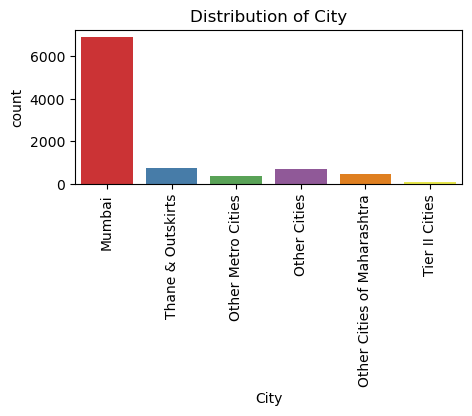

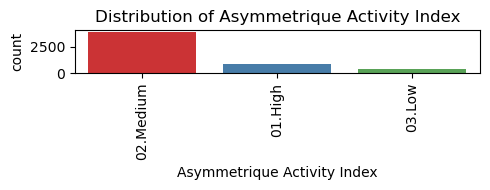

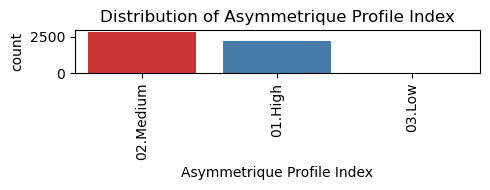

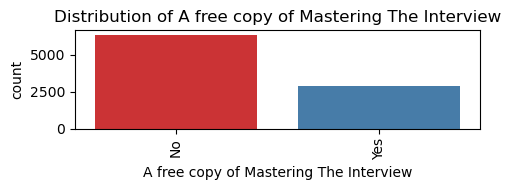

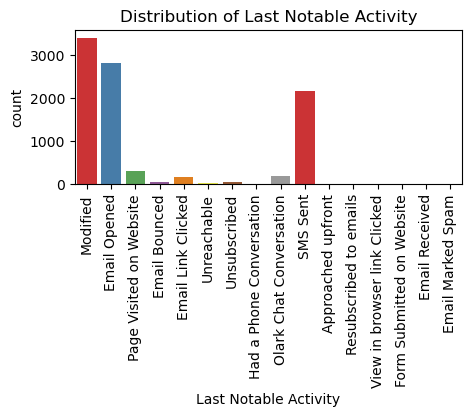

In [24]:
# Identifying most impacting variables using Univariant analysis.
cat_col1= lead_Score.select_dtypes(include=['object']).columns
# plotting allvariables in categorical column
for i in cat_col1: 
    plt.figure(figsize=(5,2))
    sns.countplot(data=lead_Score, x=i, palette='Set1')   
    plt.title(f'Distribution of {i}')
    plt.xticks(rotation = 90)
    plt.tight_layout()
    plt.show()

# Key Insights:

1. Customer was identified to be a lead on the basis of their Landing Page Submission.

2. The source of the lead majorly  is from Google search and direct traffic.

3. Last Activity of customers contribution in SMS Sent & Email Opened activities are on top.

4. More than 90% of the customers are from India, also city has majority in Mumbai.   
    
5. current occupation has more than 90% data for Unemployed.  

6. Candidates are chossing course for better career prospects.

7. 'Search','Newspaper Article','Newspaper','Digital Advertisement','Do Not Call' have only one type of value hence skewed data , no inference .



In [25]:
lead_Score['Digital Advertisement'].value_counts()

Digital Advertisement
No     9236
Yes       4
Name: count, dtype: int64

In [26]:
# these column have only one value in majority. Hence deleteing these column as they will not contribute in further analysis. 
#Dropping 'Asymmetrique Activity Index/score as it has more then 45% null values as well as no contribution for further analysis.

columns_to_drop2=['Search','Newspaper Article','Newspaper','Digital Advertisement','Do Not Call','Through Recommendations',
                 'Asymmetrique Activity Index','Asymmetrique Profile Index','Asymmetrique Activity Score','Asymmetrique Profile Score','Tags' ] 
lead_Score=lead_Score.drop(columns=columns_to_drop2, axis =1)

In [27]:
lead_Score.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 16 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Lead Origin                                    9240 non-null   object 
 1   Lead Source                                    9204 non-null   object 
 2   Do Not Email                                   9240 non-null   object 
 3   Converted                                      9240 non-null   int64  
 4   TotalVisits                                    9103 non-null   float64
 5   Total Time Spent on Website                    9240 non-null   int64  
 6   Page Views Per Visit                           9103 non-null   float64
 7   Last Activity                                  9137 non-null   object 
 8   Country                                        9240 non-null   object 
 9   Specialization                                 9240 

In [28]:
# Again calculate missing percentage in leads
100*lead_Score.isnull().mean()

Lead Origin                                      0.000000
Lead Source                                      0.389610
Do Not Email                                     0.000000
Converted                                        0.000000
TotalVisits                                      1.482684
Total Time Spent on Website                      0.000000
Page Views Per Visit                             1.482684
Last Activity                                    1.114719
Country                                          0.000000
Specialization                                   0.000000
What is your current occupation                  0.000000
What matters most to you in choosing a course    0.000000
X Education Forums                               0.000000
City                                             0.000000
A free copy of Mastering The Interview           0.000000
Last Notable Activity                            0.000000
dtype: float64

In [29]:
# Dropping rows with null values as percentage of null is 1%

lead_Score.dropna(axis=0, how='any', subset=None, inplace=True)

In [30]:
#calculate missing percentage in leads
100*lead_Score.isnull().mean()

Lead Origin                                      0.0
Lead Source                                      0.0
Do Not Email                                     0.0
Converted                                        0.0
TotalVisits                                      0.0
Total Time Spent on Website                      0.0
Page Views Per Visit                             0.0
Last Activity                                    0.0
Country                                          0.0
Specialization                                   0.0
What is your current occupation                  0.0
What matters most to you in choosing a course    0.0
X Education Forums                               0.0
City                                             0.0
A free copy of Mastering The Interview           0.0
Last Notable Activity                            0.0
dtype: float64

In [31]:
# Imputing Values for Country as India and others.
lead_Score['Country'] = lead_Score['Country'].apply(lambda x: 'India' if x == 'India' else 'Other Country')
    

In [32]:
lead_Score['Country'].value_counts()

Country
India            8787
Other Country     287
Name: count, dtype: int64

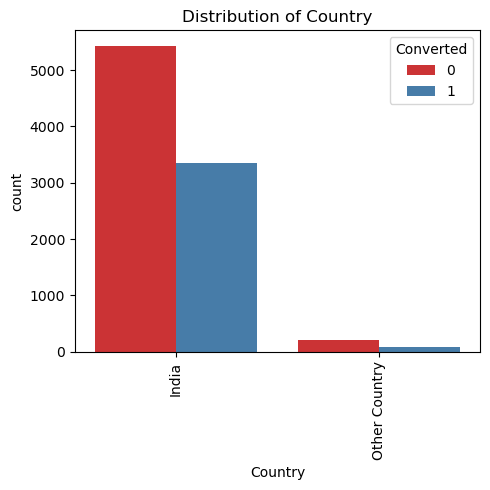

In [33]:
# Identifying most impacting variables using Univariant analysis.

plt.figure(figsize=(5,5))
sns.countplot(data=lead_Score, x='Country', hue='Converted', palette='Set1')    
plt.title(f'Distribution of Country')
plt.xticks(rotation = 90)
plt.tight_layout()
plt.show()

# Key Insights:
    
    1. Imputed country with India and other country , however its still showing majority values for India.

# Bivariant analysis.

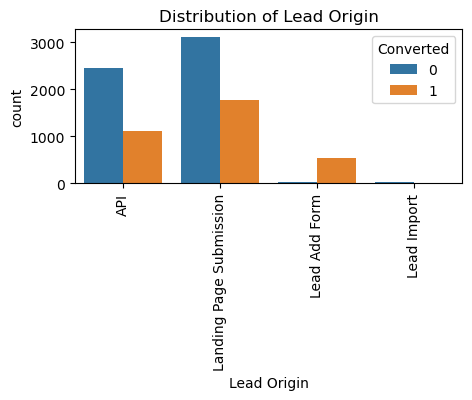

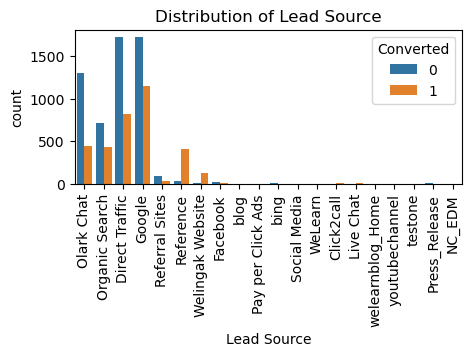

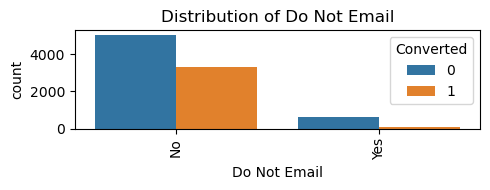

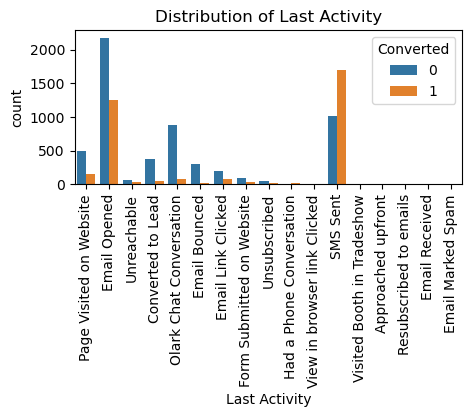

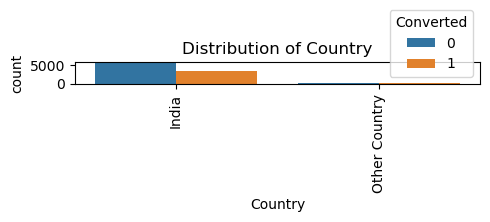

...

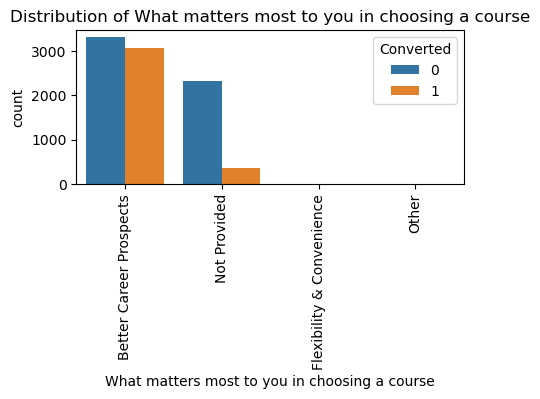

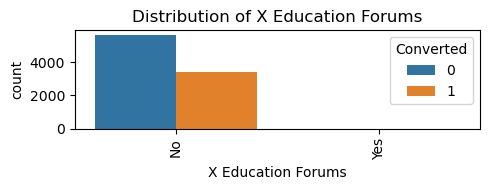

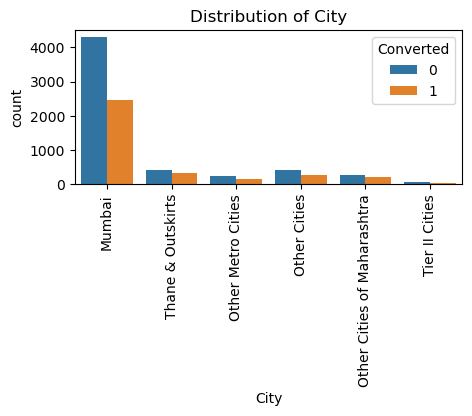

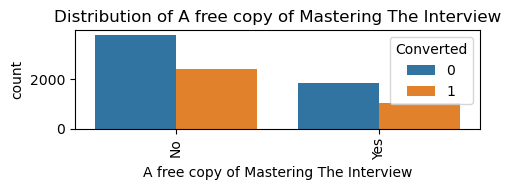

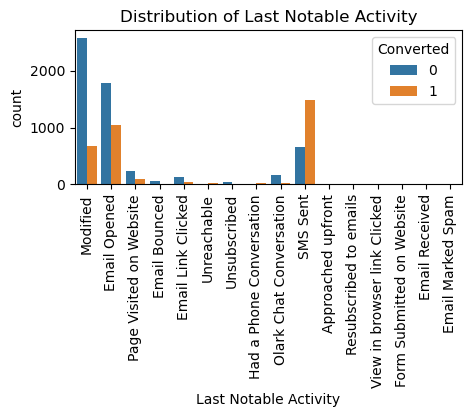

In [34]:
# Identifying most impacting variables using Bivariant analysis.
cat_col1= lead_Score.select_dtypes(include=['object']).columns
# plotting allvariables in categorical column
c=1
#fig = plt.figure(figsize=(20,15))
for i in cat_col1: 
    plt.figure(figsize=(5,2))
    #plt.subplot(8, 2, c)
    sns.countplot(data=lead_Score, x=i, hue='Converted')    
    plt.title(f'Distribution of {i}')
    c=c+1
    plt.xticks(rotation = 90)
    plt.tight_layout()
    plt.show()

# Key Insights:
    
    1. All leads originated from "Landing Page Submission" with a lead conversion rate (LCR) on lower side, the "API" 
       identified as next lead factor but with  lower conversion rate.
        
    2. Google, Direct Traffic and  Olark Chat are top lead source, however non conversion rate tends to be on higher side.
    
    3. Though People have opted that they don't want to be emailed about the course,but still that leads to about 40% of
       them converting to leads.
    
    4. Last activity of SMS sent has the highest conversion rate followed by Email opened.
    
    5. Marketing Management, HR Management, Finance Management shows good contribution in Leads conversion than other  
        specialization.
    
    6. The conversion rate is highest in Working professional,followed by unemployed.
    
    7. Choosing Better Career prospect  has highest conversion chances.  
    
    

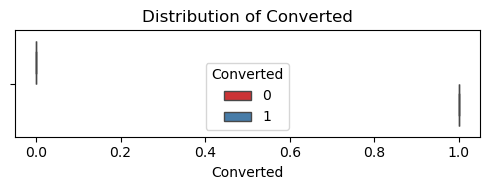

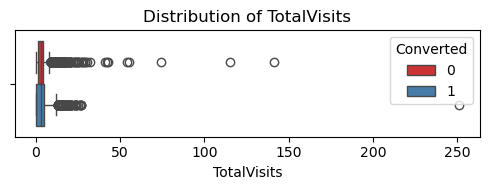

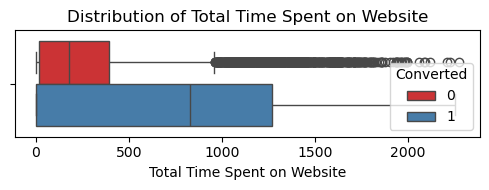

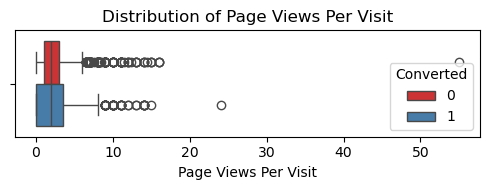

In [35]:
# Identifying most impacting variables using bivariant analysis.
num_col= ['Converted','TotalVisits','Total Time Spent on Website','Page Views Per Visit']
# plotting allvariables in categorical column

c=1
for i in num_col: 
    plt.figure(figsize=(5,2))
    sns.boxplot(data=lead_Score, x=i, hue='Converted', palette='Set1')    
    plt.title(f'Distribution of {i}')
    #plt.xticks(rotation = 90)
    #c=c+1
    plt.tight_layout()
    plt.show()


# Key Insights: 
 
Leads who spends more time on the Website have a higher chance of getting successfully converted than those who spends less time as seen in the box-plot

"TotalVisits","Page Views Per Visit":Both these variables contain outliers as can be seen in the boxplot So, These outliers needs to be treated for these variables

In [36]:
# Checking outliers
num_col1= lead_Score[['Converted','TotalVisits','Total Time Spent on Website','Page Views Per Visit']]
num_col1.describe(percentiles=[.25, .5, .75, .90, .95, .99])

,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit
count,9074.000000,9074.000000,9074.000000,9074.000000
mean,0.378554,3.456028,482.887481,2.370151
std,0.485053,4.858802,545.256560,2.160871
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,11.000000,1.000000
50%,0.000000,3.000000,246.000000,2.000000
75%,1.000000,5.000000,922.750000,3.200000
90%,1.000000,7.000000,1373.000000,5.000000
95%,1.000000,10.000000,1557.000000,6.000000
99%,1.000000,17.000000,1839.000000,9.000000


In [37]:
#Handling Outliers code.
for i in num_col:
    q1=lead_Score[i].describe()["25%"]
    q3=lead_Score[i].describe()["75%"]
    iqr=q3-q1
    upper_bound=q3+1.5*iqr
    lower_bound=q1-1.5*iqr
    lead_Score[i]=np.where (lead_Score[i]>upper_bound,upper_bound,lead_Score[i])
    lead_Score[i]=np.where(lead_Score[i]<lower_bound,lower_bound,lead_Score[i])
                

In [38]:
num_col1= lead_Score[['Converted','TotalVisits','Total Time Spent on Website','Page Views Per Visit']]
num_col1.describe(percentiles=[.25, .5, .75, .90, .95, .99])

,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit
count,9074.000000,9074.000000,9074.000000,9074.000000
mean,0.378554,3.230769,482.887481,2.285762
std,0.485053,2.880797,545.256560,1.834443
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,11.000000,1.000000
50%,0.000000,3.000000,246.000000,2.000000
75%,1.000000,5.000000,922.750000,3.200000
90%,1.000000,7.000000,1373.000000,5.000000
95%,1.000000,10.000000,1557.000000,6.000000
99%,1.000000,11.000000,1839.000000,6.500000


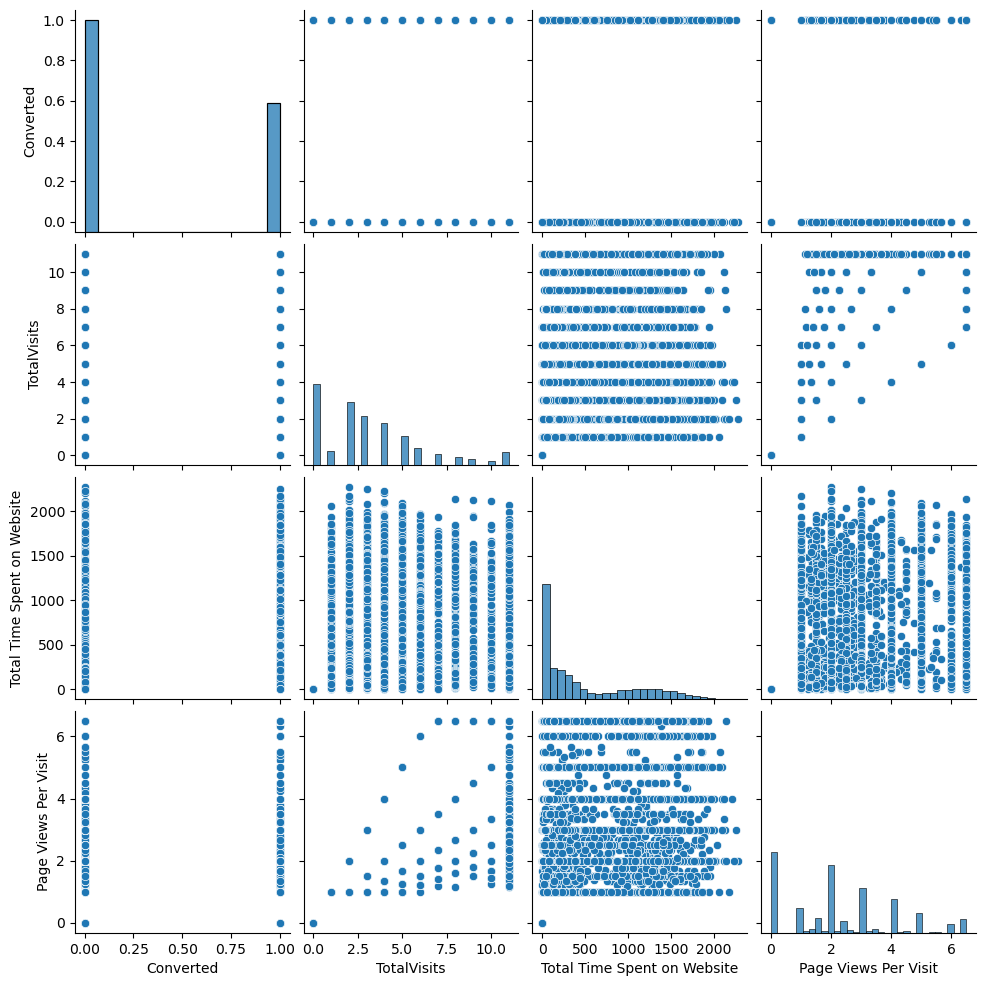

In [39]:

#Visualization of Relationship of Numerical Features against Target Variable
pairplot=sns.pairplot(lead_Score, vars=['Converted','TotalVisits','Total Time Spent on Website','Page Views Per Visit'],palette=["b"])
plt.show()

# Key Insights:
    
    There is positive correlation between Total Visit and Page Views per visit.

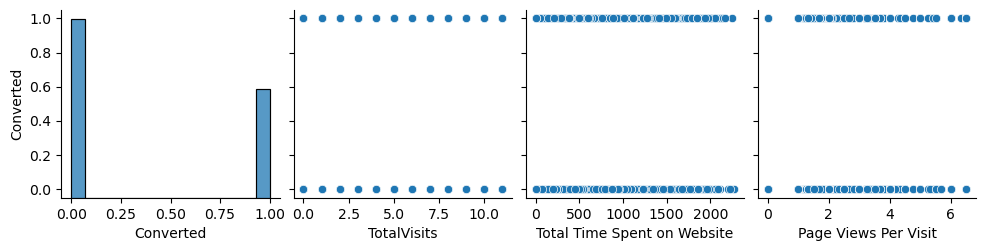

In [40]:
sns.pairplot(lead_Score,y_vars=['Converted'])
plt.show()

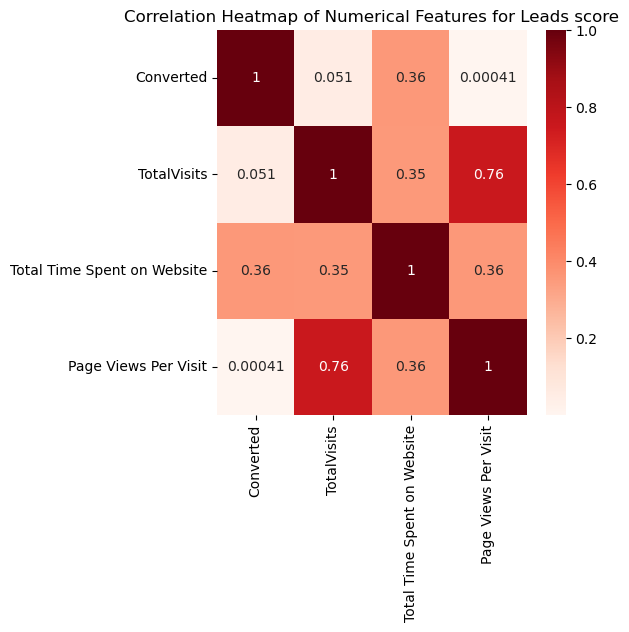

In [41]:
num_col1= ['Converted','TotalVisits','Total Time Spent on Website','Page Views Per Visit']
plt.figure(figsize=(5,5))
sns.heatmap(lead_Score[num_col1].corr().abs(), cmap='Reds', annot=True)
plt.title('Correlation Heatmap of Numerical Features for Leads score')
plt.show()

# Key Insights:
    
    1. Total Visits  has strong correlation with page views per visit.

In [42]:
#  After imputation also the values  are skewed. It has larger vol of data in one category. Hence dropping them 
lead_Score=lead_Score.drop(columns='Country', axis =1)
lead_Score=lead_Score.drop(columns='City', axis =1)

In [43]:
lead_Score.shape

(9074, 14)

# Dummy Variables

In [44]:
#Feature: Lead Origin has four levels, so it has to be encoded with the help three dummy variables
LeadOrigin_desc = pd.get_dummies(lead_Score['Lead Origin'],prefix='LeadOrigin',dtype=int,drop_first = True)

#Feature: Lead Source has 22 levels , so it has to be encoded with the help 21 dummy variables
LeadSource_desc = pd.get_dummies(lead_Score['Lead Source'],prefix='LeadSource',dtype=int,drop_first = True)

#Feature: Do Not Emai has 2 levels , so it has to be encoded with the help 1 dummy variables
DoNotEmail_desc = pd.get_dummies(lead_Score['Do Not Email'],prefix='DoNotEmail',dtype=int,drop_first = True)

#Feature: Last Activity has 19 levels , so it has to be encoded with the help 18 dummy variables
LastActivity_desc = pd.get_dummies(lead_Score['Last Activity'],prefix='LastActivity',dtype=int,drop_first = True)

#Feature: Specialization has 19 levels , so it has to be encoded with the help 18 dummy variables
Specialization_desc = pd.get_dummies(lead_Score['Specialization'],prefix='Specialization',dtype=int,drop_first = True)

#Feature: What is your current occupation has 8 levels , so it has to be encoded with the help 7 dummy variables
CurrentOccupation_desc = pd.get_dummies(lead_Score['What is your current occupation'],prefix='Occupation',dtype=int,drop_first = True)


#Feature: What matters most to you in choosing a course has four levels, so it has to be encoded with the help three dummy variables
CourseFor_desc = pd.get_dummies(lead_Score['What matters most to you in choosing a course'],prefix='CourseFor',dtype=int,drop_first = True)

#Feature: 'X Education Forums has 5 levels , so it has to be encoded with the help 4 dummy variables
XEducation_desc = pd.get_dummies(lead_Score['X Education Forums'],prefix='XEdu',dtype=int,drop_first = True)

#Feature: A free copy of Mastering The Interview has 2levels , so it has to be encoded with the help 1 dummy variables
Interview_desc = pd.get_dummies(lead_Score['A free copy of Mastering The Interview'],prefix='Interview',dtype=int,drop_first = True)

#Feature: Last Notable Activity has 16 levels  
NotableActivity_desc = pd.get_dummies(lead_Score['Last Notable Activity'],prefix='NotableActivity',dtype=int,drop_first = True)



In [45]:
# Addind dummy variables to dataframe
lead_Score = pd.concat([lead_Score, LeadOrigin_desc], axis = 1)
lead_Score = pd.concat([lead_Score,LeadSource_desc], axis = 1)
lead_Score = pd.concat([lead_Score,DoNotEmail_desc], axis = 1)
lead_Score = pd.concat([lead_Score,LastActivity_desc], axis = 1)
lead_Score = pd.concat([lead_Score,Specialization_desc], axis = 1)
lead_Score = pd.concat([lead_Score,CurrentOccupation_desc], axis = 1)
lead_Score = pd.concat([lead_Score,CourseFor_desc], axis = 1)
lead_Score = pd.concat([lead_Score,XEducation_desc], axis = 1)
lead_Score = pd.concat([lead_Score,Interview_desc], axis = 1)
lead_Score = pd.concat([lead_Score,NotableActivity_desc], axis = 1)

lead_Score.head()

,Lead Origin,Lead Source,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,What is your current occupation,What matters most to you in choosing a course,X Education Forums,A free copy of Mastering The Interview,Last Notable Activity,LeadOrigin_Landing Page Submission,LeadOrigin_Lead Add Form,LeadOrigin_Lead Import,LeadSource_Direct Traffic,LeadSource_Facebook,LeadSource_Google,LeadSource_Live Chat,LeadSource_NC_EDM,LeadSource_Olark Chat,LeadSource_Organic Search,LeadSource_Pay per Click Ads,LeadSource_Press_Release,LeadSource_Reference,LeadSource_Referral Sites,LeadSource_Social Media,LeadSource_WeLearn,LeadSource_Welingak Website,LeadSource_bing,LeadSource_blog,LeadSource_testone,LeadSource_welearnblog_Home,LeadSource_youtubechannel,DoNotEmail_Yes,LastActivity_Converted to Lead,LastActivity_Email Bounced,LastActivity_Email Link Clicked,LastActivity_Email Marked Spam,LastActivity_Email Opened,LastActivity_Email Received,LastActivity_Form Submitted on Website,LastActivity_Had a Phone Conversation,LastActivity_Olark Chat Conversation,LastActivity_Page Visited on Website,LastActivity_Resubscribed to emails,LastActivity_SMS Sent,LastActivity_Unreachable,LastActivity_Unsubscribed,LastActivity_View in browser link Clicked,LastActivity_Visited Booth in Tradeshow,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Not Provided,Specialization_Operations Management,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,Occupation_Housewife,Occupation_Not Provided,Occupation_Other,Occupation_Student,Occupation_Unemployed,Occupation_Working Professional,CourseFor_Flexibility & Convenience,CourseFor_Not Provided,CourseFor_Other,XEdu_Yes,Interview_Yes,NotableActivity_Email Bounced,NotableActivity_Email Link Clicked,NotableActivity_Email Marked Spam,NotableActivity_Email Opened,NotableActivity_Email Received,NotableActivity_Form Submitted on Website,NotableActivity_Had a Phone Conversation,NotableActivity_Modified,NotableActivity_Olark Chat Conversation,NotableActivity_Page Visited on Website,NotableActivity_Resubscribed to emails,NotableActivity_SMS Sent,NotableActivity_Unreachable,NotableActivity_Unsubscribed,NotableActivity_View in browser link Clicked
0,API,Olark Chat,No,0.0,0.0,0.0,0.0,Page Visited on Website,Not Provided,Unemployed,Better Career Prospects,No,No,Modified,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1,API,Organic Search,No,0.0,5.0,674.0,2.5,Email Opened,Not Provided,Unemployed,Better Career Prospects,No,No,Email Opened,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,Landing Page Submission,Direct Traffic,No,1.0,2.0,1532.0,2.0,Email Opened,Business Administration,Student,Better Career Prospects,No,Yes,Email Opened,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3,Landing Page Submission,Direct Traffic,No,0.0,1.0,305.0,1.0,Unreachable,Media and Advertising,Unemployed,Better Career Prospects,No,No,Modified,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,Landing Page Submission,Google,No,1.0,2.0,1428.0,1.0,Converted to Lead,N

In [46]:
# As we don't need the below mentioned Features as we have created dummies  now as we have already expanded so we can drop it
colmnToDrop=['Lead Origin','Lead Source','Do Not Email','Last Activity','Specialization','What is your current occupation','What matters most to you in choosing a course','X Education Forums','A free copy of Mastering The Interview','Last Notable Activity']
lead_Score=lead_Score.drop(columns=colmnToDrop, axis =1)
colmnToDrop1=['CourseFor_Not Provided','Specialization_Not Provided','Occupation_Not Provided']
lead_Score=lead_Score.drop(columns=colmnToDrop1, axis =1)



In [47]:

lead_Score.head()

,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,LeadOrigin_Landing Page Submission,LeadOrigin_Lead Add Form,LeadOrigin_Lead Import,LeadSource_Direct Traffic,LeadSource_Facebook,LeadSource_Google,LeadSource_Live Chat,LeadSource_NC_EDM,LeadSource_Olark Chat,LeadSource_Organic Search,LeadSource_Pay per Click Ads,LeadSource_Press_Release,LeadSource_Reference,LeadSource_Referral Sites,LeadSource_Social Media,LeadSource_WeLearn,LeadSource_Welingak Website,LeadSource_bing,LeadSource_blog,LeadSource_testone,LeadSource_welearnblog_Home,LeadSource_youtubechannel,DoNotEmail_Yes,LastActivity_Converted to Lead,LastActivity_Email Bounced,LastActivity_Email Link Clicked,LastActivity_Email Marked Spam,LastActivity_Email Opened,LastActivity_Email Received,LastActivity_Form Submitted on Website,LastActivity_Had a Phone Conversation,LastActivity_Olark Chat Conversation,LastActivity_Page Visited on Website,LastActivity_Resubscribed to emails,LastActivity_SMS Sent,LastActivity_Unreachable,LastActivity_Unsubscribed,LastActivity_View in browser link Clicked,LastActivity_Visited Booth in Tradeshow,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,Occupation_Housewife,Occupation_Other,Occupation_Student,Occupation_Unemployed,Occupation_Working Professional,CourseFor_Flexibility & Convenience,CourseFor_Other,XEdu_Yes,Interview_Yes,NotableActivity_Email Bounced,NotableActivity_Email Link Clicked,NotableActivity_Email Marked Spam,NotableActivity_Email Opened,NotableActivity_Email Received,NotableActivity_Form Submitted on Website,NotableActivity_Had a Phone Conversation,NotableActivity_Modified,NotableActivity_Olark Chat Conversation,NotableActivity_Page Visited on Website,NotableActivity_Resubscribed to emails,NotableActivity_SMS Sent,NotableActivity_Unreachable,NotableActivity_Unsubscribed,NotableActivity_View in browser link Clicked
0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1,0.0,5.0,674.0,2.5,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,1.0,2.0,1532.0,2.0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3,0.0,1.0,305.0,1.0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,1.0,2.0,1428.0,1.0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [48]:
lead_Score.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Index: 9074 entries, 0 to 9239
Data columns (total 84 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   Converted                                     9074 non-null   float64
 1   TotalVisits                                   9074 non-null   float64
 2   Total Time Spent on Website                   9074 non-null   float64
 3   Page Views Per Visit                          9074 non-null   float64
 4   LeadOrigin_Landing Page Submission            9074 non-null   int32  
 5   LeadOrigin_Lead Add Form                      9074 non-null   int32  
 6   LeadOrigin_Lead Import                        9074 non-null   int32  
 7   LeadSource_Direct Traffic                     9074 non-null   int32  
 8   LeadSource_Facebook                           9074 non-null   int32  
 9   LeadSource_Google                             9074 non-null   int32 

# Splitting the Data into Training and Testing Sets

In [49]:
# Putting feature variable to X
X = lead_Score.drop(['Converted'], axis=1)

X.head()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,LeadOrigin_Landing Page Submission,LeadOrigin_Lead Add Form,LeadOrigin_Lead Import,LeadSource_Direct Traffic,LeadSource_Facebook,LeadSource_Google,LeadSource_Live Chat,LeadSource_NC_EDM,LeadSource_Olark Chat,LeadSource_Organic Search,LeadSource_Pay per Click Ads,LeadSource_Press_Release,LeadSource_Reference,LeadSource_Referral Sites,LeadSource_Social Media,LeadSource_WeLearn,LeadSource_Welingak Website,LeadSource_bing,LeadSource_blog,LeadSource_testone,LeadSource_welearnblog_Home,LeadSource_youtubechannel,DoNotEmail_Yes,LastActivity_Converted to Lead,LastActivity_Email Bounced,LastActivity_Email Link Clicked,LastActivity_Email Marked Spam,LastActivity_Email Opened,LastActivity_Email Received,LastActivity_Form Submitted on Website,LastActivity_Had a Phone Conversation,LastActivity_Olark Chat Conversation,LastActivity_Page Visited on Website,LastActivity_Resubscribed to emails,LastActivity_SMS Sent,LastActivity_Unreachable,LastActivity_Unsubscribed,LastActivity_View in browser link Clicked,LastActivity_Visited Booth in Tradeshow,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,Occupation_Housewife,Occupation_Other,Occupation_Student,Occupation_Unemployed,Occupation_Working Professional,CourseFor_Flexibility & Convenience,CourseFor_Other,XEdu_Yes,Interview_Yes,NotableActivity_Email Bounced,NotableActivity_Email Link Clicked,NotableActivity_Email Marked Spam,NotableActivity_Email Opened,NotableActivity_Email Received,NotableActivity_Form Submitted on Website,NotableActivity_Had a Phone Conversation,NotableActivity_Modified,NotableActivity_Olark Chat Conversation,NotableActivity_Page Visited on Website,NotableActivity_Resubscribed to emails,NotableActivity_SMS Sent,NotableActivity_Unreachable,NotableActivity_Unsubscribed,NotableActivity_View in browser link Clicked
0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1,5.0,674.0,2.5,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,2.0,1532.0,2.0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3,1.0,305.0,1.0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,2.0,1428.0,1.0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [50]:
# Putting response variable to y
y = lead_Score['Converted']

y.head()

0    0.0
1    0.0
2    1.0
3    0.0
4    1.0
Name: Converted, dtype: float64

In [51]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

In [52]:
print(X_train.shape ,X_test.shape)

(6351, 83) (2723, 83)


# Feature Scaling

In [53]:
# Scale the three numeric features
scaler = StandardScaler()

X_train[['TotalVisits','Total Time Spent on Website','Page Views Per Visit']] = scaler.fit_transform(X_train[['TotalVisits','Total Time Spent on Website','Page Views Per Visit']])

X_train.head()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,LeadOrigin_Landing Page Submission,LeadOrigin_Lead Add Form,LeadOrigin_Lead Import,LeadSource_Direct Traffic,LeadSource_Facebook,LeadSource_Google,LeadSource_Live Chat,LeadSource_NC_EDM,LeadSource_Olark Chat,LeadSource_Organic Search,LeadSource_Pay per Click Ads,LeadSource_Press_Release,LeadSource_Reference,LeadSource_Referral Sites,LeadSource_Social Media,LeadSource_WeLearn,LeadSource_Welingak Website,LeadSource_bing,LeadSource_blog,LeadSource_testone,LeadSource_welearnblog_Home,LeadSource_youtubechannel,DoNotEmail_Yes,LastActivity_Converted to Lead,LastActivity_Email Bounced,LastActivity_Email Link Clicked,LastActivity_Email Marked Spam,LastActivity_Email Opened,LastActivity_Email Received,LastActivity_Form Submitted on Website,LastActivity_Had a Phone Conversation,LastActivity_Olark Chat Conversation,LastActivity_Page Visited on Website,LastActivity_Resubscribed to emails,LastActivity_SMS Sent,LastActivity_Unreachable,LastActivity_Unsubscribed,LastActivity_View in browser link Clicked,LastActivity_Visited Booth in Tradeshow,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,Occupation_Housewife,Occupation_Other,Occupation_Student,Occupation_Unemployed,Occupation_Working Professional,CourseFor_Flexibility & Convenience,CourseFor_Other,XEdu_Yes,Interview_Yes,NotableActivity_Email Bounced,NotableActivity_Email Link Clicked,NotableActivity_Email Marked Spam,NotableActivity_Email Opened,NotableActivity_Email Received,NotableActivity_Form Submitted on Website,NotableActivity_Had a Phone Conversation,NotableActivity_Modified,NotableActivity_Olark Chat Conversation,NotableActivity_Page Visited on Website,NotableActivity_Resubscribed to emails,NotableActivity_SMS Sent,NotableActivity_Unreachable,NotableActivity_Unsubscribed,NotableActivity_View in browser link Clicked
3009,-0.431325,-0.160255,-0.161929,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
1012,-0.431325,-0.540048,-0.161929,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9226,-1.124566,-0.888650,-1.247280,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4750,-0.431325,1.643304,-0.161929,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
7987,0.608537,2.017593,0.109409,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [54]:
X_train.describe()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,LeadOrigin_Landing Page Submission,LeadOrigin_Lead Add Form,LeadOrigin_Lead Import,LeadSource_Direct Traffic,LeadSource_Facebook,LeadSource_Google,LeadSource_Live Chat,LeadSource_NC_EDM,LeadSource_Olark Chat,LeadSource_Organic Search,LeadSource_Pay per Click Ads,LeadSource_Press_Release,LeadSource_Reference,LeadSource_Referral Sites,LeadSource_Social Media,LeadSource_WeLearn,LeadSource_Welingak Website,LeadSource_bing,LeadSource_blog,LeadSource_testone,LeadSource_welearnblog_Home,LeadSource_youtubechannel,DoNotEmail_Yes,LastActivity_Converted to Lead,LastActivity_Email Bounced,LastActivity_Email Link Clicked,LastActivity_Email Marked Spam,LastActivity_Email Opened,LastActivity_Email Received,LastActivity_Form Submitted on Website,LastActivity_Had a Phone Conversation,LastActivity_Olark Chat Conversation,LastActivity_Page Visited on Website,LastActivity_Resubscribed to emails,LastActivity_SMS Sent,LastActivity_Unreachable,LastActivity_Unsubscribed,LastActivity_View in browser link Clicked,LastActivity_Visited Booth in Tradeshow,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,Occupation_Housewife,Occupation_Other,Occupation_Student,Occupation_Unemployed,Occupation_Working Professional,CourseFor_Flexibility & Convenience,CourseFor_Other,XEdu_Yes,Interview_Yes,NotableActivity_Email Bounced,NotableActivity_Email Link Clicked,NotableActivity_Email Marked Spam,NotableActivity_Email Opened,NotableActivity_Email Received,NotableActivity_Form Submitted on Website,NotableActivity_Had a Phone Conversation,NotableActivity_Modified,NotableActivity_Olark Chat Conversation,NotableActivity_Page Visited on Website,NotableActivity_Resubscribed to emails,NotableActivity_SMS Sent,NotableActivity_Unreachable,NotableActivity_Unsubscribed,NotableActivity_View in browser link Clicked
count,6.351000e+03,6.351000e+03,6.351000e+03,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.0,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.0,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000
mean,-2.517275e-17,-2.908851e-17,9.118128e-17,0.535979,0.068651,0.003779,0.278066,0.003936,0.320737,0.000315,0.000157,0.186427,0.127224,0.000157,0.000157,0.051645,0.013384,0.000315,0.0,0.015903,0.000472,0.000157,0.000157,0.000157,0.000157,0.078885,0.044717,0.034640,0.028185,0.000315,0.373799,0.000315,0.011809,0.002677,0.105338,0.070698,0.000157,0.308298,0.011022,0.006141,0.000945,0.000157,0.040309,0.006456,0.011967,0.104393,0.017635,0.012282,0.094316,0.040938,0.019682,0.091324,0.022359,0.054795,0.011967,0.008818,0.003779,0.037632,0.021886,0.001102,0.001575,0.022201,0.605574,0.075894,0.0,0

# Building our model
This time, we will be using the LogisticRegression function from SciKit Learn for its compatibility with RFE (which is a utility from sklearn)

RFE Recursive feature elimination

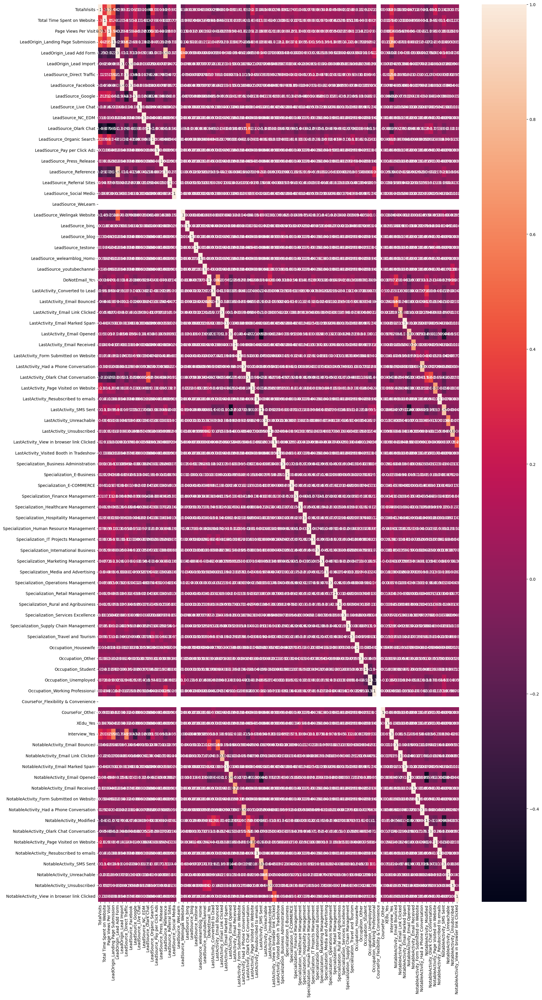

In [55]:
# Let's see the correlation matrix 
plt.figure(figsize =(20,40))        # Size of the figure
sns.heatmap(X_train.corr(),annot = True)
plt.show()

Since there are a lot of variables it is difficult to find the corelation.

# Model Building

# Feature Selection Using RFE

In [56]:
# Logistic regression model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6351
Model:                            GLM   Df Residuals:                     6271
Model Family:                Binomial   Df Model:                           79
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2457.8
Date:                Mon, 19 Aug 2024   Deviance:                       4915.6
Time:                        14:19:53   Pearson chi2:                 6.15e+03
No. Iterations:                    22   Pseudo R-squ. (CS):             0.4283
Covariance Type:            nonrobust                                         
================================================================================================================
                                                   coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------
const                                           23.4499   7.95e+04      0.000      1.000   -1.56e+05    1.56e+05
TotalVisits                                      0.3406      0.057      5.992      0.000       0.229       0.452
Total Time Spent on Website                      1.1245      0.042     26.547      0.000       1.041       1.207
Page Views Per Visit                            -0.3074      0.064     -4.827      0.000      -0.432      -0.183
LeadOrigin_Landing Page Submission              -0.5220      0.132     -3.968      0.000      -0.780      -0.264
LeadOrigin_Lead Add Form                        -0.9119      1.555     -0.587      0.558      -3.959       2.135
LeadOrigin_Lead Import                          24.2618   7.95e+04      0.000      1.000   -1.56e+05    1.56e+05
LeadSource_Direct Traffic                       -2.8724      2.021     -1.421      0.155      -6.833       1.088
LeadSource_Facebook                            -26.0766   7.95e+04     -0.000      1.000   -1.56e+05    1.56e+05
LeadSource_Google                               -2.6135      2.019     -1.295      0.195      -6.570       1.343
LeadSource_Live Chat                            22.2662   5.62e+04      0.000      1.000    -1.1e+05     1.1e+05
LeadSource_NC_EDM                               21.4512   7.95e+04      0.000      1.000   -1.56e+05    1.56e+05
LeadSource_Olark Chat                           -1.5003      2.011     -0.746      0.456      -5.442       2.441
LeadSource_Organic Search                       -2.8131      2.022     -1.391      0.164      -6.776       1.150
LeadSource_Pay per Click Ads                   -24.4821   7.95e+04     -0.000      1.000   -1.56e+05    1.56e+05
LeadSource_Press_Release                       -23.4515   7.95e+04     -0.000      1.000   -1.56e+05    1.56e+05
LeadSource_Reference                             1.4606      1.297      1.126      0.260      -1.082       4.004
LeadSource_Referral Sites                       -2.9416      2.048     -1.436      0.151      -6.956       1.073
LeadSource_Social Media                         -0.8172      2.539     -0.322      0.748      -5.793       4.159
LeadSource_WeLearn                            3.874e-10   2.91e-05   1.33e-05      1.000    -5.7e-05     5.7e-05
LeadSource_Welingak Website                      3.6886      1.472      2.506      0.012       0.804       6.573
LeadSource_bing                                 -1.9149      2.484     -0.771      0.441      -6.784       2.954
LeadSource_blog                                -24.3507   7.95e+04     -0.000      1.000   -1.56e+05    1.56e+05
LeadSource_testone                             -24.6262   7.95e+04     -0.000      1.000   -1.56e+05    1.56e+05
LeadSource_welearnblog_Home     

In [57]:
logreg = LogisticRegression()

In [58]:
from sklearn.feature_selection import RFE
rfe = RFE(logreg, n_features_to_select=20)             # running RFE with20 variables as output
rfe = rfe.fit(X_train, y_train)

In [59]:
rfe.support_

array([False,  True, False, False,  True, False,  True, False,  True,
       False, False, False,  True, False, False, False,  True, False,
       False,  True, False, False, False, False, False,  True, False,
       False, False, False, False, False, False,  True,  True, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False,  True,  True,  True,  True,
        True, False, False, False, False, False,  True, False,  True,
       False, False, False,  True,  True,  True, False, False, False,
       False, False])

In [60]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('TotalVisits', False, 22),
 ('Total Time Spent on Website', True, 1),
 ('Page Views Per Visit', False, 23),
 ('LeadOrigin_Landing Page Submission', False, 27),
 ('LeadOrigin_Lead Add Form', True, 1),
 ('LeadOrigin_Lead Import', False, 13),
 ('LeadSource_Direct Traffic', True, 1),
 ('LeadSource_Facebook', False, 48),
 ('LeadSource_Google', True, 1),
 ('LeadSource_Live Chat', False, 45),
 ('LeadSource_NC_EDM', False, 12),
 ('LeadSource_Olark Chat', False, 11),
 ('LeadSource_Organic Search', True, 1),
 ('LeadSource_Pay per Click Ads', False, 43),
 ('LeadSource_Press_Release', False, 54),
 ('LeadSource_Reference', False, 4),
 ('LeadSource_Referral Sites', True, 1),
 ('LeadSource_Social Media', False, 15),
 ('LeadSource_WeLearn', False, 64),
 ('LeadSource_Welingak Website', True, 1),
 ('LeadSource_bing', False, 59),
 ('LeadSource_blog', False, 44),
 ('LeadSource_testone', False, 39),
 ('LeadSource_welearnblog_Home', False, 50),
 ('LeadSource_youtubechannel', False, 51),
 ('DoNotEmail_Yes'

In [61]:
X_train.columns[~rfe.support_]

Index(['TotalVisits', 'Page Views Per Visit',
       'LeadOrigin_Landing Page Submission', 'LeadOrigin_Lead Import',
       'LeadSource_Facebook', 'LeadSource_Live Chat', 'LeadSource_NC_EDM',
       'LeadSource_Olark Chat', 'LeadSource_Pay per Click Ads',
       'LeadSource_Press_Release', 'LeadSource_Reference',
       'LeadSource_Social Media', 'LeadSource_WeLearn', 'LeadSource_bing',
       'LeadSource_blog', 'LeadSource_testone', 'LeadSource_welearnblog_Home',
       'LeadSource_youtubechannel', 'LastActivity_Converted to Lead',
       'LastActivity_Email Bounced', 'LastActivity_Email Link Clicked',
       'LastActivity_Email Marked Spam', 'LastActivity_Email Opened',
       'LastActivity_Email Received', 'LastActivity_Form Submitted on Website',
       'LastActivity_Page Visited on Website',
       'LastActivity_Resubscribed to emails', 'LastActivity_SMS Sent',
       'LastActivity_Unreachable', 'LastActivity_Unsubscribed',
       'LastActivity_View in browser link Clicked',
     

In [62]:
X_train_rfe =  X_train[X_train.columns[rfe.support_]]
X_train_rfe.head()

,Total Time Spent on Website,LeadOrigin_Lead Add Form,LeadSource_Direct Traffic,LeadSource_Google,LeadSource_Organic Search,LeadSource_Referral Sites,LeadSource_Welingak Website,DoNotEmail_Yes,LastActivity_Had a Phone Conversation,LastActivity_Olark Chat Conversation,Occupation_Housewife,Occupation_Other,Occupation_Student,Occupation_Unemployed,Occupation_Working Professional,NotableActivity_Email Link Clicked,NotableActivity_Email Opened,NotableActivity_Modified,NotableActivity_Olark Chat Conversation,NotableActivity_Page Visited on Website
3009,-0.160255,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1012,-0.540048,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0
9226,-0.888650,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
4750,1.643304,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7987,2.017593,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0


# Model 1

In [63]:
X_train_sm = sm.add_constant(X_train_rfe)
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6351
Model:                            GLM   Df Residuals:                     6330
Model Family:                Binomial   Df Model:                           20
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2542.8
Date:                Mon, 19 Aug 2024   Deviance:                       5085.5
Time:                        14:19:59   Pearson chi2:                 6.22e+03
No. Iterations:                    21   Pseudo R-squ. (CS):             0.4127
Covariance Type:            nonrobust                                         
===========================================================================================================
                                              coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------
const                                       0.6303      0.125      5.032      0.000       0.385       0.876
Total Time Spent on Website                 1.1373      0.041     27.541      0.000       1.056       1.218
LeadOrigin_Lead Add Form                    2.3301      0.230     10.148      0.000       1.880       2.780
LeadSource_Direct Traffic                  -1.6477      0.120    -13.729      0.000      -1.883      -1.413
LeadSource_Google                          -1.2028      0.114    -10.553      0.000      -1.426      -0.979
LeadSource_Organic Search                  -1.4787      0.138    -10.696      0.000      -1.750      -1.208
LeadSource_Referral Sites                  -1.5291      0.356     -4.293      0.000      -2.227      -0.831
LeadSource_Welingak Website                 2.0758      0.758      2.739      0.006       0.590       3.561
DoNotEmail_Yes                             -1.8658      0.180    -10.390      0.000      -2.218      -1.514
LastActivity_Had a Phone Conversation       1.8489      0.789      2.343      0.019       0.303       3.395
LastActivity_Olark Chat Conversation       -1.1546      0.193     -5.979      0.000      -1.533      -0.776
Occupation_Housewife                       23.8093   1.57e+04      0.002      0.999   -3.08e+04    3.08e+04
Occupation_Other                            2.1288      0.721      2.954      0.003       0.716       3.541
Occupation_Student                          1.2460      0.233      5.350      0.000       0.790       1.702
Occupation_Unemployed                       1.1548      0.089     12.941      0.000       0.980       1.330
Occupation_Working Professional             3.6043      0.200     18.038      0.000       3.213       3.996
NotableActivity_Email Link Clicked         -1.7177      0.261     -6.577      0.000      -2.230      -1.206
NotableActivity_Email Opened               -1.3407      0.090    -14.872      0.000      -1.517      -1.164
NotableActivity_Modified                   -1.7848      0.098    -18.154      0.000      -1.977      -1.592
NotableActivity_Olark Chat Conversation    -1.4691      0.379     -3.878      0.000      -2.212      -0.727
NotableActivity_Page Visited on Website    -1.5573      0.207     -7.524      0.000      -1.963      -1.152
===========================================================================================================
"""

In [64]:
#check VIF

def checkVIF(X):
    vif = pd.DataFrame()
    vif['Features'] = X.columns
    vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif['VIF'] = round(vif['VIF'], 2)
    vif = vif.sort_values(by = "VIF", ascending = False)
    return(vif)

In [65]:
#Calculating the Variance Inflation Factor
checkVIF(X_train_sm)

,Features,VIF
0,const,13.36
4,LeadSource_Google,2.40
3,LeadSource_Direct Traffic,2.37
18,NotableActivity_Modified,1.84
2,LeadOrigin_Lead Add Form,1.79
5,LeadSource_Organic Search,1.76
10,LastActivity_Olark Chat Conversation,1.70
17,NotableActivity_Email Opened,1.61
14,Occupation_Unemployed,1.35
15,Occupation_Working Professional,1.35


In [66]:
# As Pvalue is very high  for the Feature 'Occupation_Housewife' so we can drop it 
X_train_rfe = X_train_sm.drop('Occupation_Housewife',axis=1)
X_train_rfe.columns

Index(['const', 'Total Time Spent on Website', 'LeadOrigin_Lead Add Form',
       'LeadSource_Direct Traffic', 'LeadSource_Google',
       'LeadSource_Organic Search', 'LeadSource_Referral Sites',
       'LeadSource_Welingak Website', 'DoNotEmail_Yes',
       'LastActivity_Had a Phone Conversation',
       'LastActivity_Olark Chat Conversation', 'Occupation_Other',
       'Occupation_Student', 'Occupation_Unemployed',
       'Occupation_Working Professional', 'NotableActivity_Email Link Clicked',
       'NotableActivity_Email Opened', 'NotableActivity_Modified',
       'NotableActivity_Olark Chat Conversation',
       'NotableActivity_Page Visited on Website'],
      dtype='object')

# Model 2

In [67]:
X_train_sm = sm.add_constant(X_train_rfe)
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6351
Model:                            GLM   Df Residuals:                     6331
Model Family:                Binomial   Df Model:                           19
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2550.6
Date:                Mon, 19 Aug 2024   Deviance:                       5101.1
Time:                        14:19:59   Pearson chi2:                 6.25e+03
No. Iterations:                     7   Pseudo R-squ. (CS):             0.4113
Covariance Type:            nonrobust                                         
===========================================================================================================
                                              coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------
const                                       0.6428      0.125      5.145      0.000       0.398       0.888
Total Time Spent on Website                 1.1365      0.041     27.578      0.000       1.056       1.217
LeadOrigin_Lead Add Form                    2.3908      0.230     10.410      0.000       1.941       2.841
LeadSource_Direct Traffic                  -1.6385      0.120    -13.680      0.000      -1.873      -1.404
LeadSource_Google                          -1.1973      0.114    -10.523      0.000      -1.420      -0.974
LeadSource_Organic Search                  -1.4593      0.138    -10.587      0.000      -1.729      -1.189
LeadSource_Referral Sites                  -1.5251      0.356     -4.288      0.000      -2.222      -0.828
LeadSource_Welingak Website                 2.0249      0.758      2.671      0.008       0.539       3.511
DoNotEmail_Yes                             -1.8666      0.180    -10.391      0.000      -2.219      -1.515
LastActivity_Had a Phone Conversation       1.8477      0.789      2.343      0.019       0.302       3.394
LastActivity_Olark Chat Conversation       -1.1524      0.193     -5.970      0.000      -1.531      -0.774
Occupation_Other                            2.1020      0.720      2.918      0.004       0.690       3.514
Occupation_Student                          1.2186      0.233      5.234      0.000       0.762       1.675
Occupation_Unemployed                       1.1288      0.088     12.755      0.000       0.955       1.302
Occupation_Working Professional             3.5766      0.200     17.928      0.000       3.186       3.968
NotableActivity_Email Link Clicked         -1.6932      0.258     -6.553      0.000      -2.200      -1.187
NotableActivity_Email Opened               -1.3304      0.090    -14.782      0.000      -1.507      -1.154
NotableActivity_Modified                   -1.7846      0.098    -18.162      0.000      -1.977      -1.592
NotableActivity_Olark Chat Conversation    -1.4716      0.379     -3.887      0.000      -2.214      -0.730
NotableActivity_Page Visited on Website    -1.5574      0.207     -7.530      0.000      -1.963      -1.152
===========================================================================================================
"""

In [68]:
#Calculating the Variance Inflation Factor
checkVIF(X_train_sm)

,Features,VIF
0,const,13.35
4,LeadSource_Google,2.40
3,LeadSource_Direct Traffic,2.37
17,NotableActivity_Modified,1.84
2,LeadOrigin_Lead Add Form,1.79
5,LeadSource_Organic Search,1.76
10,LastActivity_Olark Chat Conversation,1.70
16,NotableActivity_Email Opened,1.61
18,NotableActivity_Olark Chat Conversation,1.35
13,Occupation_Unemployed,1.34


In [69]:
# As Pvalue is very high  for the Feature 'LastActivity_Had a Phone Conversation' so we can drop it 
X_train_rfe = X_train_sm.drop('LastActivity_Had a Phone Conversation',axis=1)
X_train_rfe.columns

Index(['const', 'Total Time Spent on Website', 'LeadOrigin_Lead Add Form',
       'LeadSource_Direct Traffic', 'LeadSource_Google',
       'LeadSource_Organic Search', 'LeadSource_Referral Sites',
       'LeadSource_Welingak Website', 'DoNotEmail_Yes',
       'LastActivity_Olark Chat Conversation', 'Occupation_Other',
       'Occupation_Student', 'Occupation_Unemployed',
       'Occupation_Working Professional', 'NotableActivity_Email Link Clicked',
       'NotableActivity_Email Opened', 'NotableActivity_Modified',
       'NotableActivity_Olark Chat Conversation',
       'NotableActivity_Page Visited on Website'],
      dtype='object')

# Checking P-value and VIF 

In [70]:
X_train_sm = sm.add_constant(X_train_rfe)
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6351
Model:                            GLM   Df Residuals:                     6332
Model Family:                Binomial   Df Model:                           18
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2553.9
Date:                Mon, 19 Aug 2024   Deviance:                       5107.9
Time:                        14:20:00   Pearson chi2:                 6.26e+03
No. Iterations:                     7   Pseudo R-squ. (CS):             0.4107
Covariance Type:            nonrobust                                         
===========================================================================================================
                                              coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------
const                                       0.6466      0.125      5.175      0.000       0.402       0.891
Total Time Spent on Website                 1.1349      0.041     27.581      0.000       1.054       1.216
LeadOrigin_Lead Add Form                    2.3895      0.230     10.404      0.000       1.939       2.840
LeadSource_Direct Traffic                  -1.6361      0.120    -13.666      0.000      -1.871      -1.401
LeadSource_Google                          -1.1898      0.114    -10.468      0.000      -1.413      -0.967
LeadSource_Organic Search                  -1.4474      0.138    -10.517      0.000      -1.717      -1.178
LeadSource_Referral Sites                  -1.4946      0.351     -4.259      0.000      -2.182      -0.807
LeadSource_Welingak Website                 2.0246      0.758      2.670      0.008       0.539       3.511
DoNotEmail_Yes                             -1.8723      0.180    -10.417      0.000      -2.225      -1.520
LastActivity_Olark Chat Conversation       -1.1587      0.193     -6.005      0.000      -1.537      -0.780
Occupation_Other                            2.1005      0.720      2.917      0.004       0.689       3.512
Occupation_Student                          1.2187      0.233      5.234      0.000       0.762       1.675
Occupation_Unemployed                       1.1313      0.088     12.790      0.000       0.958       1.305
Occupation_Working Professional             3.5743      0.199     17.921      0.000       3.183       3.965
NotableActivity_Email Link Clicked         -1.7025      0.258     -6.591      0.000      -2.209      -1.196
NotableActivity_Email Opened               -1.3407      0.090    -14.909      0.000      -1.517      -1.164
NotableActivity_Modified                   -1.7875      0.098    -18.211      0.000      -1.980      -1.595
NotableActivity_Olark Chat Conversation    -1.4730      0.379     -3.892      0.000      -2.215      -0.731
NotableActivity_Page Visited on Website    -1.5678      0.207     -7.584      0.000      -1.973      -1.163
===========================================================================================================
"""

In [71]:
#Calculating the Variance Inflation Factor
checkVIF(X_train_sm)

,Features,VIF
0,const,13.34
4,LeadSource_Google,2.40
3,LeadSource_Direct Traffic,2.37
16,NotableActivity_Modified,1.84
2,LeadOrigin_Lead Add Form,1.79
5,LeadSource_Organic Search,1.76
9,LastActivity_Olark Chat Conversation,1.70
15,NotableActivity_Email Opened,1.60
17,NotableActivity_Olark Chat Conversation,1.35
12,Occupation_Unemployed,1.34


# All the VIF values are good and all the p-values are below 0.05. So we can fix model.

# Creating Prediction

In [72]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

3009    0.075014
1012    0.524841
9226    0.265383
4750    0.705877
7987    0.655667
1281    0.835968
2880    0.052946
4971    0.939845
7536    0.871164
1248    0.613699
dtype: float64

In [73]:
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0.07501376, 0.52484068, 0.26538284, 0.70587744, 0.65566728,
       0.83596773, 0.05294627, 0.93984545, 0.87116415, 0.61369858])

In [74]:
# Data frame with given convertion rate and probablity of predicted ones
y_train_pred_final = pd.DataFrame({'Converted':y_train.values, 'Conversion_Prob':y_train_pred})
y_train_pred_final['Lead Number'] = y_train.index
y_train_pred_final.head()

,Converted,Conversion_Prob,Lead Number
0,0.0,0.075014,3009
1,0.0,0.524841,1012
2,0.0,0.265383,9226
3,1.0,0.705877,4750
4,1.0,0.655667,7987


In [75]:
# Substituting 0 or 1 with the cut off as 0.5
y_train_pred_final['Predicted'] = y_train_pred_final.Conversion_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Converted,Conversion_Prob,Lead Number,Predicted
0,0.0,0.075014,3009,0
1,0.0,0.524841,1012,1
2,0.0,0.265383,9226,0
3,1.0,0.705877,4750,1
4,1.0,0.655667,7987,1


# Model Evaluation

In [76]:
# Creating confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.Predicted )
confusion

array([[3470,  435],
       [ 724, 1722]], dtype=int64)

In [77]:
# Check the overall accuracy
metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.Predicted)

0.817509053692332

# overall accuracy is around 82% accuracy.

In [78]:
#Calculating the Variance Inflation Factor
checkVIF(X_train_sm)

,Features,VIF
0,const,13.34
4,LeadSource_Google,2.40
3,LeadSource_Direct Traffic,2.37
16,NotableActivity_Modified,1.84
2,LeadOrigin_Lead Add Form,1.79
5,LeadSource_Organic Search,1.76
9,LastActivity_Olark Chat Conversation,1.70
15,NotableActivity_Email Opened,1.60
17,NotableActivity_Olark Chat Conversation,1.35
12,Occupation_Unemployed,1.34


In [79]:
# Substituting the value of true positive
TP = confusion[1,1]
# Substituting the value of true negatives
TN = confusion[0,0]
# Substituting the value of false positives
FP = confusion[0,1] 
# Substituting the value of false negatives
FN = confusion[1,0]

In [80]:
# Calculating the sensitivity
TP/(TP+FN)

0.7040065412919051

In [81]:
# Calculating the specificity
TN/(TN+FP)

0.8886043533930857

# With the current cut off as 0.5 we have around 82% accuracy, sensitivity of around 70% and specificity of around 89%.

# Optimise Cut off (ROC Curve)

In [82]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [83]:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Converted, y_train_pred_final.Conversion_Prob, drop_intermediate = False )

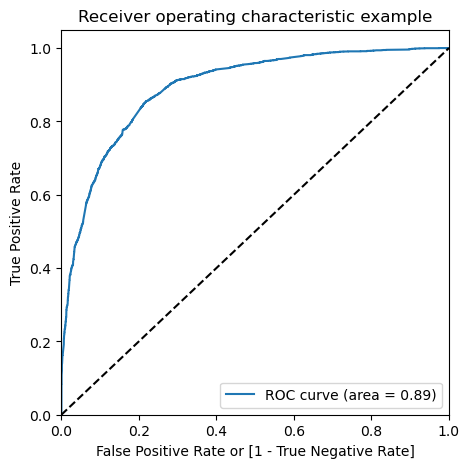

In [84]:
draw_roc(y_train_pred_final.Converted, y_train_pred_final.Conversion_Prob)

The area under ROC curve is 0.89.

In [85]:
# Creating columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Conversion_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Converted,Conversion_Prob,Lead Number,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0.0,0.075014,3009,0,1,0,0,0,0,0,0,0,0,0
1,0.0,0.524841,1012,1,1,1,1,1,1,1,0,0,0,0
2,0.0,0.265383,9226,0,1,1,1,0,0,0,0,0,0,0
3,1.0,0.705877,4750,1,1,1,1,1,1,1,1,1,0,0
4,1.0,0.655667,7987,1,1,1,1,1,1,1,1,0,0,0


In [86]:
# Creating a dataframe to see the values of accuracy, sensitivity, and specificity at different values of probabiity cutoffs
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
# Making confusing matrix to find values of sensitivity, accurace and specificity for each level of probablity
from sklearn.metrics import confusion_matrix
num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
cutoff_df

,prob,accuracy,sensi,speci
0.0,0.0,0.385136,1.000000,0.000000
0.1,0.1,0.609353,0.978741,0.377977
0.2,0.2,0.770745,0.917416,0.678873
0.3,0.3,0.803496,0.865086,0.764917
0.4,0.4,0.813573,0.779231,0.835083
0.5,0.5,0.817509,0.704007,0.888604
0.6,0.6,0.807432,0.629191,0.919078
0.7,0.7,0.781609,0.517580,0.946991
0.8,0.8,0.759251,0.425593,0.968246
0.9,0.9,0.716895,0.286182,0.986684


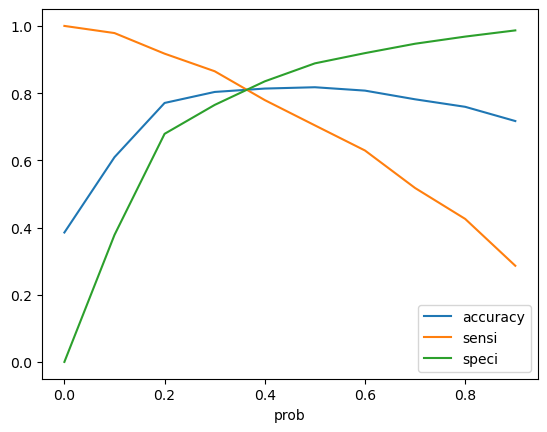

In [87]:
# Plotting it
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

From the graph it is visible that the optimal cut off is at 0.37.

In [88]:
y_train_pred_final['final_predicted'] = y_train_pred_final.Conversion_Prob.map( lambda x: 1 if x > 0.37 else 0)
y_train_pred_final.head()

,Converted,Conversion_Prob,Lead Number,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0.0,0.075014,3009,0,1,0,0,0,0,0,0,0,0,0,0
1,0.0,0.524841,1012,1,1,1,1,1,1,1,0,0,0,0,1
2,0.0,0.265383,9226,0,1,1,1,0,0,0,0,0,0,0,0
3,1.0,0.705877,4750,1,1,1,1,1,1,1,1,1,0,0,1
4,1.0,0.655667,7987,1,1,1,1,1,1,1,1,0,0,0,1


In [89]:
# Check the overall accuracy
metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.final_predicted)

0.8115257439773264

In [90]:
# Creating confusion matrix 
confusion2 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.final_predicted )
confusion2

array([[3203,  702],
       [ 495, 1951]], dtype=int64)

In [91]:
# Substituting the value of true positive
TP = confusion2[1,1]
# Substituting the value of true negatives
TN = confusion2[0,0]
# Substituting the value of false positives
FP = confusion2[0,1] 
# Substituting the value of false negatives
FN = confusion2[1,0]

In [92]:
# Calculating the sensitivity
TP/(TP+FN)

0.7976287816843827

In [93]:
# Calculating the specificity
TN/(TN+FP)

0.8202304737516005

With the current cut off as 0.37 we have accuracy, sensitivity  is around 80% and specificity of around 82%.

In [94]:
# Calculate false postive rate - predicting conversion when customer does not have converted
print(FP/ float(TN+FP))

0.17976952624839948


In [95]:
# Positive predictive value 
print (TP / float(TP+FP))

0.7353938937052393


In [96]:
# Positive predictive value 
print (TP / float(TP+FP))

0.7353938937052393


In [97]:
# Negative predictive value
print (TN / float(TN+ FN))

0.866143861546782


# Precision and Recall

In [98]:
#Looking at the confusion matrix again

In [99]:
confusion = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.final_predicted )
confusion

array([[3203,  702],
       [ 495, 1951]], dtype=int64)

Precision
TP / TP + FP

In [100]:
confusion[1,1]/(confusion[0,1]+confusion[1,1])

0.7353938937052393

# Recall
TP / TP + FN

In [101]:
confusion[1,1]/(confusion[1,0]+confusion[1,1])

0.7976287816843827

In [102]:
from sklearn.metrics import precision_score, recall_score

In [103]:
precision_score(y_train_pred_final.Converted, y_train_pred_final.final_predicted)

0.7353938937052393

In [104]:
recall_score(y_train_pred_final.Converted, y_train_pred_final.final_predicted)

0.7976287816843827

 We have Recall score as 79.7% and Precision score as 73.5 %

# Precision and recall tradeoff

In [105]:
from sklearn.metrics import precision_recall_curve

In [106]:
y_train_pred_final.Converted, y_train_pred_final.final_predicted

(0       0.0
 1       0.0
 2       0.0
 3       1.0
 4       1.0
 5       1.0
 6       0.0
 7       1.0
 8       1.0
 9       0.0
 10      0.0
 11      0.0
 12      0.0
 13      1.0
 14      1.0
 15      1.0
 16      0.0
 17      0.0
 18      0.0
 19      0.0
 20      1.0
 21      0.0
 22      0.0
 23      0.0
 24      1.0
 25      0.0
 26      1.0
 27      1.0
 28      0.0
 29      1.0
 30      0.0
 31      1.0
 32      1.0
 33      0.0
 34      1.0
 35      0.0
 36      0.0
 37      0.0
 38      0.0
 39      0.0
 40      0.0
 41      0.0
 42      1.0
 43      1.0
 44      1.0
 45      0.0
 46      1.0
 47      0.0
 48      1.0
 49      1.0
 50      0.0
 51      1.0
 52      1.0
 53      0.0
 54      0.0
 55      0.0
 56      0.0
 57      1.0
 58      1.0
 59      0.0
 60      0.0
 61      0.0
 62      0.0
 63      1.0
 64      0.0
 65      1.0
 66      0.0
 67      0.0
 68      1.0
 69      0.0
 70      1.0
 71      1.0
 72      0.0
 73      1.0
 74      0.0
 75      1.0
 76      1.0

In [107]:
p, r, thresholds = precision_recall_curve(y_train_pred_final.Converted, y_train_pred_final.Conversion_Prob)

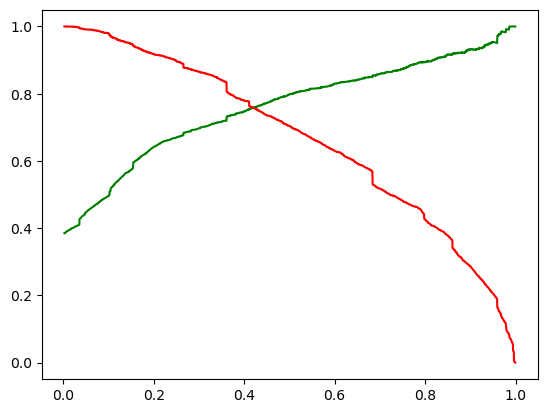

In [108]:
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

# Prediction on Test set

In [109]:
 #Scaling numeric values
X_test[['TotalVisits','Total Time Spent on Website','Page Views Per Visit']] = scaler.transform(X_test[['TotalVisits','Total Time Spent on Website','Page Views Per Visit']])

In [110]:
X_train_rfe=X_train_rfe.drop(columns='const', axis =1)

In [111]:
col=X_train_rfe

In [112]:
col

,Total Time Spent on Website,LeadOrigin_Lead Add Form,LeadSource_Direct Traffic,LeadSource_Google,LeadSource_Organic Search,LeadSource_Referral Sites,LeadSource_Welingak Website,DoNotEmail_Yes,LastActivity_Olark Chat Conversation,Occupation_Other,Occupation_Student,Occupation_Unemployed,Occupation_Working Professional,NotableActivity_Email Link Clicked,NotableActivity_Email Opened,NotableActivity_Modified,NotableActivity_Olark Chat Conversation,NotableActivity_Page Visited on Website
3009,-0.160255,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1012,-0.540048,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0
9226,-0.888650,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
4750,1.643304,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7987,2.017593,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
1281,0.916743,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2880,-0.881311,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0
4971,1.903838,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
7536,2.740484,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0
1248,1.857970,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0


In [113]:
# Select the columns in X_train for X_test as well
X_test = X_test[col.columns]
X_test.head()

# Add a constant to X_test



,Total Time Spent on Website,LeadOrigin_Lead Add Form,LeadSource_Direct Traffic,LeadSource_Google,LeadSource_Organic Search,LeadSource_Referral Sites,LeadSource_Welingak Website,DoNotEmail_Yes,LastActivity_Olark Chat Conversation,Occupation_Other,Occupation_Student,Occupation_Unemployed,Occupation_Working Professional,NotableActivity_Email Link Clicked,NotableActivity_Email Opened,NotableActivity_Modified,NotableActivity_Olark Chat Conversation,NotableActivity_Page Visited on Website
3271,-0.600595,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1490,1.887326,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0
7936,-0.752879,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0
4216,-0.888650,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0
3830,-0.587751,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0


In [114]:
X_test_sm = sm.add_constant(X_test)

# Making predictions on the test set

In [115]:
y_test_pred = res.predict(X_test_sm)

In [116]:
y_test_pred[:10]

3271    0.071393
1490    0.967264
7936    0.060750
4216    0.811339
3830    0.056862
1800    0.698490
6507    0.462115
4821    0.312737
4223    0.959255
4714    0.104380
dtype: float64

In [117]:
# Converting y_pred to a dataframe which is an array
y_pred_1 = pd.DataFrame(y_test_pred)

In [118]:
# Let's see the head
y_pred_1.head()

,0
3271,0.071393
1490,0.967264
7936,0.060750
4216,0.811339
3830,0.056862


In [119]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

In [120]:
# Putting CustID to index
y_test_df['Lead Number'] = y_test_df.index

In [121]:
# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

In [122]:
# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)

In [123]:
y_pred_final.head()

,Converted,Lead Number,0
0,0.0,3271,0.071393
1,1.0,1490,0.967264
2,0.0,7936,0.060750
3,1.0,4216,0.811339
4,0.0,3830,0.056862


In [124]:
# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 0 : 'Conversion_Prob'})

In [125]:
# Rearranging the columns
y_pred_final = y_pred_final.reindex(['Lead Number','Converted','Conversion_Prob'], axis=1)

In [126]:
# Let's see the head of y_pred_final
y_pred_final.head()

,Lead Number,Converted,Conversion_Prob
0,3271,0.0,0.071393
1,1490,1.0,0.967264
2,7936,0.0,0.060750
3,4216,1.0,0.811339
4,3830,0.0,0.056862


In [127]:
y_pred_final['final_predicted'] = y_pred_final.Conversion_Prob.map(lambda x: 1 if x > 0.37 else 0)

In [128]:
y_pred_final.head()

,Lead Number,Converted,Conversion_Prob,final_predicted
0,3271,0.0,0.071393,0
1,1490,1.0,0.967264,1
2,7936,0.0,0.060750,0
3,4216,1.0,0.811339,1
4,3830,0.0,0.056862,0


In [129]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_pred_final.Converted, y_pred_final.final_predicted)

0.8090341535071612

In [130]:
confusion2 = metrics.confusion_matrix(y_pred_final.Converted, y_pred_final.final_predicted )
confusion2

array([[1424,  310],
       [ 210,  779]], dtype=int64)

In [131]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [132]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.7876643073811931

In [133]:
# Let us calculate specificity
TN / float(TN+FP)

0.8212226066897347

With the current cut off as 0.37 we have accuracy around 81%, sensitivity around  79% and specificity of around 82%.

# Optimise Cut off (ROC Curve)

In [134]:
fpr, tpr, thresholds = metrics.roc_curve( y_pred_final.Converted, y_pred_final.Conversion_Prob, drop_intermediate = False )

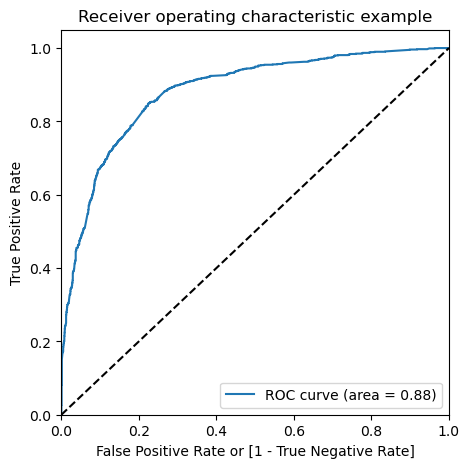

In [135]:
draw_roc(y_pred_final.Converted, y_pred_final.Conversion_Prob)

# Precision and Recall

In [136]:
precision_score(y_pred_final.Converted, y_pred_final.final_predicted)

0.7153351698806244

In [137]:
recall_score(y_pred_final.Converted, y_pred_final.final_predicted)

0.7876643073811931

We have Recallscore as 78.7% and Precision score as 71.5%.

# Conclusion

The variables that mattered the most in the potential buyers are :

1  The total time spend on the website.

2  When the lead source is:
    
        A. Google
        
        B. Direct traffic
        
        C. Organic search
        
        D. Welingak website
        
        E. Referral sites
        
3  When the last activity is

        A. Olark chat conversation
    
4  When the lead origin is lead add format.

5  Current occupation  as a working professional students and unemployed candidates

6  Notable activity is email link clicked and email opened.



These variable  X Education can consider and acheive high chance to convert their all the potential buyers .